# Breed and service dog detection

By: Xinlin Yang, Pusheng Li, Yuyan Wang

**Dataset Description**

We have utilized Stanford Dogs Dataset: http://vision.stanford.edu/aditya86/ImageNetDogs/ (selected 30 breeds).

Two more cetegories of dogs: service dog and dog wearing clothes will be added and collected by our group.

## **1. Description**




Our project is dedicated to creating an advanced system that employs Deep Learning to identify dog breeds from images. This endeavor aims not only to recognize and classify over distinct breeds but also extends its capabilities to discern service dogs and domestic dogs adorned with clothing.

The inclusion of service dogs in our classification system acknowledges their unique roles and the necessity for their quick identification in various environments, enhancing accessibility and support for individuals with disabilities. Recognizing domestic dogs in clothing addresses the practical aspect of pet ownership where dogs are often dressed for weather protection or fasion. These dogs are quite similar to the service dogs, thus we would like to accurately identify their differences. This comprehensive approach broadens the utility of our system across multiple platforms, including pet adoption agencies, veterinary clinics, and enhancing public safety, aiding in the swift reunion of lost pets with their families and ensuring breed-specific care.

By adding these categories, our project becomes more versatile and inclusive. It helps us better understand and value the variety in the dog world, leading to more creative and personalized services and care.

### **Project Flow Diagram**

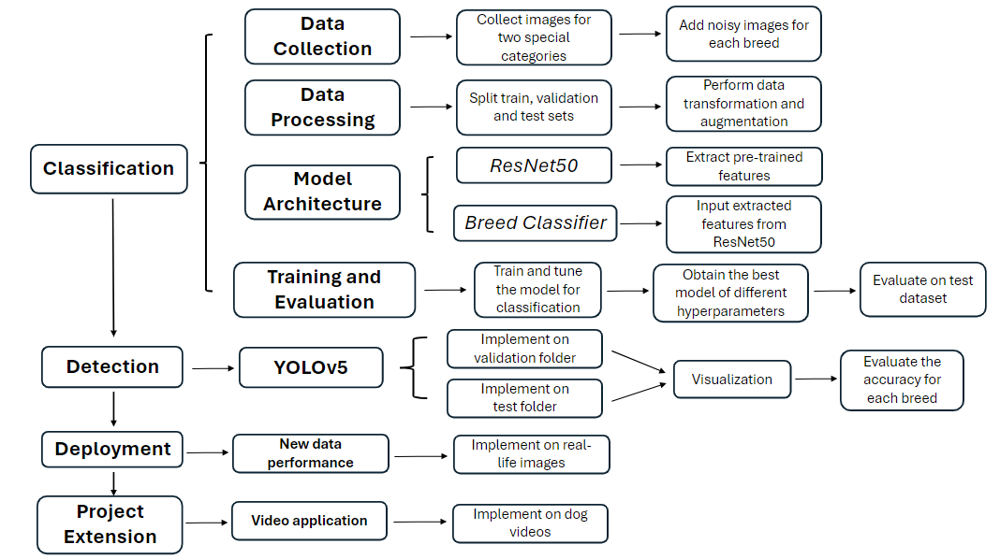

## **2. Data**

Our dataset is a collection of images designed to train our machine learning system in the recognition of dog breeds, service dogs, and domestic dogs in clothing. It comprises 30 breeds selected from the well-regarded Stanford Dogs Dataset, ensuring a broad representation of diversity. Each of the 30 breeds contains 150 images. To make the identification more challenging, we have carefully chosen 10 images for each breed with more noise, amounting to a total of 4,800 images for breed identification alone. We also have additionally gathered 160 images of service dogs and 160 images of domestic dogs in clothing with enough noise to enhance our system's capability in recognizing. Through this diverse and extensive dataset, we aim to achieve precise classification and foster a deeper understanding of the varied roles dogs play in our lives.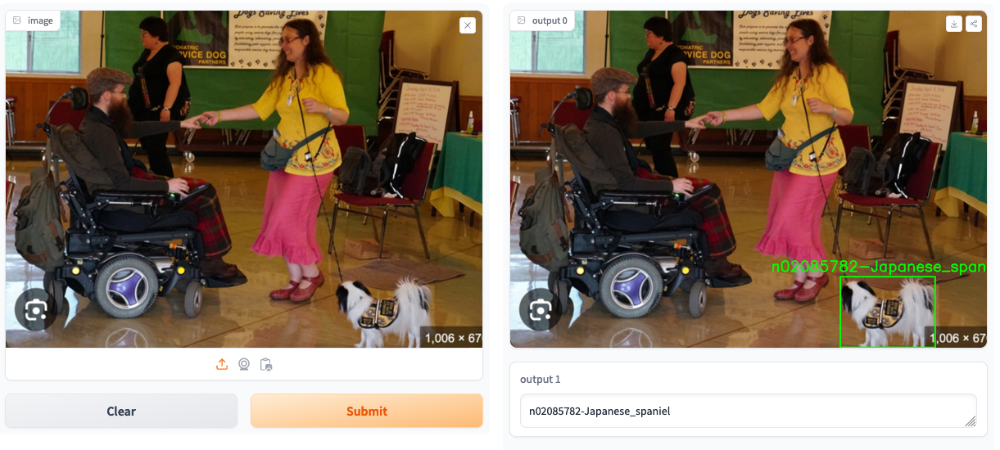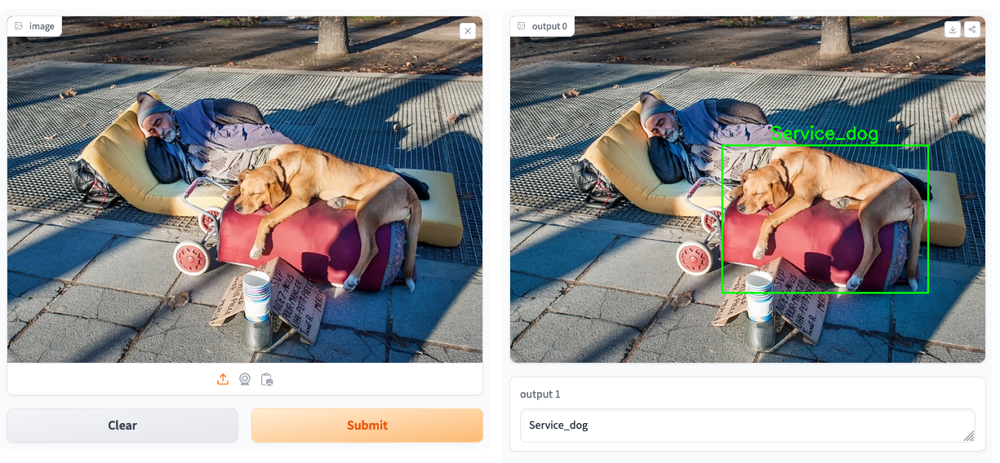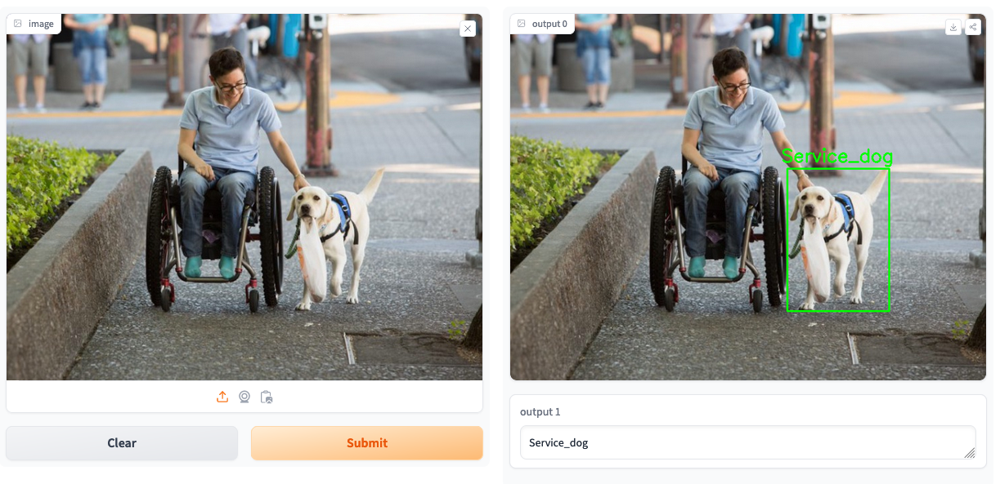

### 2.1 Data Loading

The data loading process involves setting up the environment in Google Colab and preparing the dataset for the dog breed identification project. It starts with installing Git Large File Storage (LFS) to handle large datasets efficiently. Following this, the project's GitHub repository containing the dataset is cloned into the Colab environment. The dataset, divided into two zipped files (dog_dataset.zip and new_data.zip), is then extracted. These files include images of 30 selected dog breeds from the Stanford Dogs Dataset, along with 160 images each of service dogs and domestic dogs in clothing, readying the dataset for further preprocessing and model training steps.

In [ ]:
from google.colab import files
import pandas as pd
import numpy as np
import time
import torch
import torch.nn as nn
import torchvision.models as models
import torch.nn.functional as F
import torch.optim as optim #for gradient descent
import torchvision
from torch.utils.data.sampler import SubsetRandomSampler
import torchvision.transforms as transforms
from torchvision import datasets, models, transforms
from torch.utils.data import DataLoader, TensorDataset
import matplotlib.pyplot as plt
from google.colab import drive
import os
import shutil
import random
import warnings
# Ignore all warnings
warnings.filterwarnings("ignore")


In [ ]:
# import zipped dataset from github
!apt-get install git-lfs
!git lfs install
!git clone https://github.com/xlin-marcia/Breed-and-Service-Dog-Detection.git

Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
git-lfs is already the newest version (3.0.2-1ubuntu0.2).
0 upgraded, 0 newly installed, 0 to remove and 39 not upgraded.
Git LFS initialized.
Cloning into 'Breed-and-Service-Dog-Detection'...
remote: Enumerating objects: 22, done.
remote: Counting objects: 100% (22/22), done.
remote: Compressing objects: 100% (18/18), done.
remote: Total 22 (delta 4), reused 13 (delta 1), pack-reused 0
Receiving objects: 100% (22/22), 7.51 MiB | 14.09 MiB/s, done.
Resolving deltas: 100% (4/4), done.


In [ ]:
%cd Breed-and-Service-Dog-Detection
!git lfs pull

/content/Breed-and-Service-Dog-Detection


In [ ]:
# unzip the stanford dataset folder
!unzip dog_dataset.zip
!unzip new_data.zip
# output too long, deleted for clarity

### 2.2 Data Processing and Organization

Initially, a new directory, splitted_data, is created to store the organized images. The dataset includes images of 30 selected dog breeds, along with special categories for service dogs and domestic dogs in clothing, totaling 32 categories.

In [ ]:
!mkdir ./splitted_data

In [ ]:
import pandas as pd
from PIL import Image
import matplotlib.pyplot as plt

data_dir = "/content/Breed-and-Service-Dog-Detection/dog_dataset"
split_data_dir = "/content/Breed-and-Service-Dog-Detection/splitted_data"
breeds = [
    'Service_dog', 'n02115641-dingo', 'n02113624-toy_poodle', 'n02112137-chow',
    'n02111889-Samoyed', 'n02110063-malamute', 'n02108915-French_bulldog',
    'n02105162-malinois', 'n02104029-kuvasz', 'n02101556-clumber', 'n02101388-Brittany_spaniel',
    'n02100735-English_setter', 'n02099601-golden_retriever', 'n02097047-miniature_schnauzer',
    'n02096585-Boston_bull', 'n02096437-Dandie_Dinmont', 'n02096177-cairn', 'n02096051-Airedale',
    'n02092339-Weimaraner', 'n02088364-beagle', 'n02088238-basset', 'n02088094-Afghan_hound',
    'n02087394-Rhodesian_ridgeback', 'n02087046-toy_terrier', 'n02086910-papillon',
    'n02086646-Blenheim_spaniel', 'n02086240-Shih-Tzu', 'n02086079-Pekinese', 'n02085936-Maltese_dog',
    'n02085782-Japanese_spaniel', 'n02085620-Chihuahua', 'Domestic_dogs_with_clothes']
len(breeds)

32

For each category, the images are first sorted and then divided into subsets: 128 images for training, 16 for validation, and 16 for testing. This split ensures a consistent distribution across all categories, allowing the model to learn from a varied dataset while also providing sets for performance evaluation and generalization testing. Each subset of images is then copied into corresponding subdirectories within splitted_data, organized by training, validation, and test folders.

In [ ]:
#split data into train, val, and test
target_dir = {
    "train": os.path.join(split_data_dir, "train"),
    "val": os.path.join(split_data_dir, "val"),
    "test": os.path.join(split_data_dir, "test")
}
# Create target director8ies if they do not exist
for dir_path in target_dir.values():
    os.makedirs(dir_path, exist_ok=True)

for breed in breeds:
    breed_dir = os.path.join(data_dir, breed)
    images = sorted(os.listdir(breed_dir)[:160])

    # Split images into train(128), val(16), and test(16) sets
    train_images = images[:128]
    val_images = images[128:144]
    test_images = images[144:]


    # copy images to target directory
    def copy_images(image_list, target_subdir):
        target_breed_dir = os.path.join(target_subdir, breed)
        os.makedirs(target_breed_dir, exist_ok=True)
        for image in image_list:
            src_path = os.path.join(breed_dir, image)
            dst_path = os.path.join(target_breed_dir, image)
            shutil.copy(src_path, dst_path)

    # Copy images to respective directories
    copy_images(train_images, target_dir["train"])
    copy_images(val_images, target_dir["val"])
    copy_images(test_images, target_dir["test"])

    print(f"Processed {breed}: {len(train_images)} train, {len(val_images)} val, {len(test_images)} test images.")


Processed Service_dog: 128 train, 16 val, 16 test images.
Processed n02115641-dingo: 128 train, 16 val, 16 test images.
Processed n02113624-toy_poodle: 128 train, 16 val, 16 test images.
Processed n02112137-chow: 128 train, 16 val, 16 test images.
Processed n02111889-Samoyed: 128 train, 16 val, 16 test images.
Processed n02110063-malamute: 128 train, 16 val, 16 test images.
Processed n02108915-French_bulldog: 128 train, 16 val, 16 test images.
Processed n02105162-malinois: 128 train, 16 val, 16 test images.
Processed n02104029-kuvasz: 128 train, 16 val, 16 test images.
Processed n02101556-clumber: 128 train, 16 val, 16 test images.
Processed n02101388-Brittany_spaniel: 128 train, 16 val, 16 test images.
Processed n02100735-English_setter: 128 train, 16 val, 16 test images.
Processed n02099601-golden_retriever: 128 train, 16 val, 16 test images.
Processed n02097047-miniature_schnauzer: 128 train, 16 val, 16 test images.
Processed n02096585-Boston_bull: 128 train, 16 val, 16 test images.

### 2.3 Dataset Visualization and Transformation

Here we define a transformation pipeline to resize images and convert them to tensors, then loads image datasets from specified directories into DataLoaders, organizing images by class and batching them for processing. The code supports training, validation, and testing phases by creating separate DataLoaders for each. Finally, we check the shape of the first batch of images from the training set to ensure they are correctly processed, ready for use in training a model.

In [ ]:
# Pre-defined parameters to load images
transformation = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
])
def load_dataset(data_dir, transformation, bs=32):
    dataset = datasets.ImageFolder(root=data_dir, transform=transformation)
    return torch.utils.data.DataLoader(dataset, batch_size=bs, shuffle=True)
# Load datasets with transformations
train_loader = load_dataset(target_dir["train"], transformation)
val_loader = load_dataset(target_dir["val"], transformation)
test_loader = load_dataset(target_dir["test"], transformation)

# check shapes of images
images, labels = next(iter(train_loader))
images.shape

torch.Size([32, 3, 224, 224])

Now let's visualize the first 20 images from a batch in the dataset, alongside their corresponding labels.

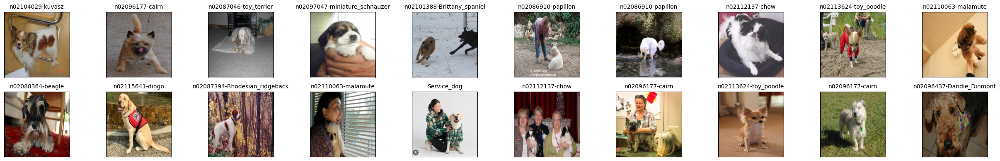

In [ ]:
# Visualize some sample data
images = images.numpy()
# plot the images in the batch, along with the corresponding labels
fig = plt.figure(figsize=(25, 4))
for idx in np.arange(20):
    ax = fig.add_subplot(2, 10, idx+1, xticks=[], yticks=[])
    plt.imshow(np.transpose(images[idx], (1, 2, 0)))
    ax.set_title(breeds[labels[idx]], fontsize=10)

# Adjust layout to add more space between subplots
plt.tight_layout()

### 2.4 Data Augmentation

Data augmentation aims to prevent overfitting and improve the model's ability to generalize from the training data to unseen data, thereby enhancing its predictive performance on real-world images.

In [ ]:
!pip install tensorflow

Using the ImageDataGenerator, we apply random rotations up to 15 degrees, horizontal flips, and nearest fill mode for pixels introduced by transformations. A function, augment_images_in_folder, processes images within a specified folder, loading and resizing them to 224x224 pixels, then converting them to numpy arrays for augmentation. For each image, it generates two augmented versions to diversify the training data further. This process is repeated across the train, validation, and test directories, applying augmentation to each class within these sets.

In [ ]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing import image
import numpy as np
import os

# Define the data augmentation parameters
datagen = ImageDataGenerator(
    rotation_range=15,  # Random rotation up to 15 degrees
    horizontal_flip=True,  # Random horizontal flip
    fill_mode='nearest'  # Fill mode for newly created pixels
)

In [ ]:
# Function to perform data augmentation on images in a folder
def augment_images_in_folder(folder_path):
    for filename in os.listdir(folder_path):
        if filename.endswith('.jpg') or filename.endswith('.jpeg') or filename.endswith('.png'):
            img_path = os.path.join(folder_path, filename)
            img = image.load_img(img_path, target_size=(224, 224))  # Load and resize the image to 224x224
            x = image.img_to_array(img)  # Convert image to numpy array
            x = np.expand_dims(x, axis=0)  # Expand dimensions to create a batch size of 1

            # Generate augmented images
            i = 0
            for batch in datagen.flow(x, batch_size=1):
                new_img = image.array_to_img(batch[0])

                # Save augmented image with a new name
                new_name = f"{os.path.splitext(filename)[0]}_augmentation_{i}.jpg"
                new_img.save(os.path.join(folder_path, new_name))
                i += 1
                if i % 2 == 0:  # Generate 2 augmented images and then stop
                    break

# Define and iterate through parent directories for train, val, and test sets to perform data augmentation
directories = {
    "train": "/content/Breed-and-Service-Dog-Detection/splitted_data/train",
    "val": "/content/Breed-and-Service-Dog-Detection/splitted_data/val",
    "test": "/content/Breed-and-Service-Dog-Detection/splitted_data/test"
}

for key, parent_directory in directories.items():
    class_count = 0
    for folder_name in os.listdir(parent_directory):
        folder_path = os.path.join(parent_directory, folder_name)
        if os.path.isdir(folder_path):
            augment_images_in_folder(folder_path)
            class_count += 1
    print(f"Completed augmentation on {key} folder for {class_count} classes.")


Completed augmentation on train folder for 32 classes.
Completed augmentation on val folder for 32 classes.
Completed augmentation on test folder for 32 classes.


## **3. Model Architecture**

### 3.1 Extract features (ResNet50)

We use a pretrained ResNet-50 model to extract features from images in the training, validation, and test datasets. It applies defined transformations to resize and convert images into tensors, then iteratively processes each dataset through ResNet-50, collecting output features and corresponding labels. The features are flattened before concatenation. Finally, the extracted features and labels for each dataset are saved to disk. The sizes of the features and labels tensors are printed to verify their dimensions, confirming successful feature extraction and storage.

In [ ]:
resnet50 = models.resnet50(pretrained=True)
resnet50 = torch.nn.Sequential(*(list(resnet50.children())[:-1]))

# Function to extract features using ResNet-50
def compute_resnet50_features(dataloader):
    features = []
    labels = []
    resnet50.eval()
    with torch.no_grad():
        for inputs, label in dataloader:
            # Move inputs to GPU if available
            if torch.cuda.is_available():
                inputs = inputs.cuda()
                babel = label.cuda()
                resnet50.cuda()
            output = resnet50(inputs)
            # Flatten the features
            output = torch.flatten(output, 1)
            features.append(output)
            labels.append(label)

    # Concatenate all features and labels from the DataLoader
    return torch.cat(features), torch.cat(labels)

# Define data transformations
transformation = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
])


# Load datasets with transformations

train_loader = load_dataset('/content/Breed-and-Service-Dog-Detection/splitted_data/train', transformation, bs=1)
val_loader = load_dataset('/content/Breed-and-Service-Dog-Detection/splitted_data/val', transformation, bs=1)
test_loader = load_dataset('/content/Breed-and-Service-Dog-Detection/splitted_data/test', transformation, bs=1)

# Extract features
train_features, train_labels = compute_resnet50_features(train_loader)
val_features, val_labels = compute_resnet50_features(val_loader)
test_features, test_labels = compute_resnet50_features(test_loader)

# Check the size of extracted features and labels
print(train_features.size(), train_labels.size())
print(val_features.size(), val_labels.size())
print(test_features.size(), test_labels.size())

# Save features and labels
print('Saving features and labels....')
torch.save(train_features, 'train_features.pt')
torch.save(val_features, 'val_features.pt')
torch.save(test_features, 'test_features.pt')
torch.save(train_labels, 'train_labels.pt')
torch.save(val_labels, 'val_labels.pt')
torch.save(test_labels, 'test_labels.pt')
print('Done!')

### 3.2 Classifier Model

We define a simple neural network classifier that can be used with features extracted by ResNet-50. The classifier consists of a fully connected layer reducing dimensionality from the input size (2048, matching ResNet-50's output after removing last layer) to 64, followed by a ReLU activation and dropout for regularization. The final fully connected layer maps these 64 features to the number of classes (32). This setup is typically used to classify images into one of the predefined classes based on the features extracted by ResNet-50.

In [ ]:
# breed classifier (input extracted feature from ResNet50)
import torch.nn as nn

class Classifier_Breed(nn.Module):
    def __init__(self, input_size=2048, num_classes=32, dropout=0.2):
        super(Classifier_Breed, self).__init__()

        # First fully connected layer
        self.fc1 = nn.Linear(input_size, 2048)  # Increased units
        self.bn1 = nn.BatchNorm1d(2048)  # Batch normalization
        self.relu1 = nn.ReLU()
        self.dropout1 = nn.Dropout(dropout)

        # Second fully connected layer
        self.fc2 = nn.Linear(2048, 1024)  # Increased units
        self.bn2 = nn.BatchNorm1d(1024)  # Batch normalization
        self.relu2 = nn.ReLU()
        self.dropout2 = nn.Dropout(dropout)

        # Third fully connected layer
        self.fc3 = nn.Linear(1024, 512)  # Increased units
        self.bn3 = nn.BatchNorm1d(512)  # Batch normalization
        self.relu3 = nn.ReLU()
        self.dropout3 = nn.Dropout(dropout)

        # Fourth fully connected layer
        self.fc4 = nn.Linear(512, 256)  # Increased units
        self.bn4 = nn.BatchNorm1d(256)  # Batch normalization
        self.relu4 = nn.ReLU()
        self.dropout4 = nn.Dropout(dropout)

        # Fifth fully connected layer
        self.fc5 = nn.Linear(256, 64)  # Increased units
        self.bn5 = nn.BatchNorm1d(64)  # Batch normalization
        self.relu5 = nn.ReLU()
        self.dropout5 = nn.Dropout(dropout)

        # Final layer
        self.fc6 = nn.Linear(64, num_classes)

    def forward(self, x):
        x = self.fc1(x)
        x = self.bn1(x)
        x = self.relu1(x)
        x = self.dropout1(x)

        x = self.fc2(x)
        x = self.bn2(x)
        x = self.relu2(x)
        x = self.dropout2(x)

        x = self.fc3(x)
        x = self.bn3(x)
        x = self.relu3(x)
        x = self.dropout3(x)

        x = self.fc4(x)
        x = self.bn4(x)
        x = self.relu4(x)
        x = self.dropout4(x)

        x = self.fc5(x)
        x = self.bn5(x)
        x = self.relu5(x)
        x = self.dropout5(x)

        x = self.fc6(x)
        return x


### 3.3 Define helper functions

Then we define functions to train a classifier model using extracted features, evaluate its accuracy, and manage its naming convention for saving. It trains the model on pre-extracted features, computing loss and accuracy for both training and validation datasets across specified epochs. We optimize the model using stochastic gradient descent, save the model's state, and visualize the training process through loss and accuracy plots.

In [ ]:
def get_accuracy(model, data_loader):
    model.eval()

    correct_predictions = 0
    total_predictions = 0

    # Use CUDA if available
    use_cuda = torch.cuda.is_available()
    if use_cuda:
        model = model.cuda()

    with torch.no_grad():
        for features, labels in data_loader:
            if use_cuda:
                features, labels = features.cuda(), labels.cuda()

            # Forward pass to get the model's predictions
            outputs = model(features)
            _, predicted_labels = torch.max(outputs, 1)

            # Update the counts for correct predictions and total predictions
            correct_predictions += (predicted_labels == labels).sum().item()
            total_predictions += labels.size(0)

    accuracy = correct_predictions / total_predictions

    return accuracy

def get_model_name(name, batch_size, learning_rate, epoch):
    """
    Generate a name for the model to save based on the parameters.
    """
    return "{}_bs{}_lr{}_epoch{}.pth".format(name, batch_size, learning_rate, epoch)

def train_extracted_features(model, train_feature_loader, val_feature_loader, num_epochs=20, learning_rate=0.01, batch_size=32):
    print(f"Total {num_epochs} epochs, lr = {learning_rate}, bs = {batch_size}.")
    print(f"Start training {model.__class__.__name__} model...")
    criterion = nn.CrossEntropyLoss()
    optimizer = optim.SGD(model.parameters(), lr=learning_rate, momentum=0.9)

    use_cuda = torch.cuda.is_available()
    if use_cuda:
        model.cuda()
        print('CUDA available, training on GPU...')

    losses, train_accs, val_accs = [], [], []
    best_val_acc = 0
    best_epoch = 0

    for epoch in range(num_epochs):
        model.train()
        epoch_loss = 0.0
        for features, labels in train_feature_loader:
            if use_cuda:
                features, labels = features.cuda(), labels.cuda()

            optimizer.zero_grad()
            outputs = model(features)
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()
            epoch_loss += loss.item()

        # Calculate average loss and train accuracy
        avg_epoch_loss = epoch_loss / len(train_feature_loader)
        train_accuracy = get_accuracy(model, train_feature_loader)
        val_accuracy = get_accuracy(model, val_feature_loader)

        losses.append(avg_epoch_loss)
        train_accs.append(train_accuracy)
        val_accs.append(val_accuracy)

        if val_accuracy > best_val_acc:
            best_val_acc = val_accuracy
            best_epoch = epoch
            model_path = f"model_{model.__class__.__name__}_bs{batch_size}_lr{learning_rate}_epoch{best_epoch}.pth"

        print(f"Epoch {epoch}: Train Loss: {avg_epoch_loss:.4f}, Train Acc: {train_accuracy * 100:.2f}%, Val Acc: {val_accuracy * 100:.2f}%")

    torch.save(model.state_dict(), model_path)
    print(f"Best model saved at {model_path} with accuracy {best_val_acc:.4f}")

    # Plotting
    plt.title("Training Curve")
    plt.plot(losses, label="Train Loss")
    plt.xlabel("Epochs")
    plt.ylabel("Loss")
    plt.legend()
    plt.show()

    plt.title("Accuracy Curve")
    plt.plot(train_accs, label="Train Acc")
    plt.plot(val_accs, label="Val Acc")
    plt.xlabel("Epochs")
    plt.ylabel("Accuracy")
    plt.legend()
    plt.show()

## **4. Model Training (Classifier)**

Now, let's see the process of the model training.

### 4.1 Hyperparameter Tuning


First, we perform hyperparameter tuning that experiments  with different settings for batch size (bs), learning rate (lr), number of epochs (epoch_num), and dropout rate (dropout) across five models to optimize the neural network's performance.

**Batch size** affects how many examples the model sees before it updates the weights. Larger batches provide a more accurate estimate of the gradient, but smaller batches can lead to faster convergence and better generalization.

**Learning rate** determines the size of the steps the optimizer takes during training. A higher learning rate can speed up learning but may overshoot the minimum, while a lower learning rate may ensure more precise convergence at the cost of speed.

**Number of epochs** is the number of times the entire dataset is passed through the network. More epochs can lead to better learning until a point of diminishing returns or overfitting.

**Dropout rate** helps prevent overfitting by randomly dropping units (along with their connections) during training, which forces the network to learn more robust features.

Tuning these parameters allows for finding a balance between training speed, convergence accuracy, and the model's ability to generalize to unseen data, aiming to achieve the highest possible accuracy on the validation and test sets.







In [ ]:
data_dir = '/content/Breed-and-Service-Dog-Detection'
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

# Load precomputed features and convert them
train_features = torch.from_numpy(torch.load('train_features.pt').cpu().detach().numpy())
val_features = torch.from_numpy(torch.load('val_features.pt').cpu().detach().numpy())
test_features = torch.from_numpy(torch.load('test_features.pt').cpu().detach().numpy())

print(train_features.shape)
print(train_labels.shape)
print(val_features.shape)
print(val_labels.shape)
print(test_features.shape)
print(test_labels.shape)

torch.Size([13062, 2048])
torch.Size([13062])
torch.Size([1536, 2048])
torch.Size([1536])
torch.Size([1536, 2048])
torch.Size([1536])


For each model with different hyperparameters, we plot the training loss curve as well as the training and validation accuracy curve to see if the model is underfitting or overfitting.

We determine the best model based on the highest **validation accuracy** because it provides a reliable estimate of how well the model generalizes to unseen data. Unlike training accuracy, which might be high due to overfitting, where the model learns specific patterns or noise in the training data rather than generalizing from it. Validation accuracy is measured on a separate set that the model hasn't seen during training. This makes it a more unbiased indicator of the model's performance in real-world scenarios.

#### Model 1

- bs = 128

- lr = 0.001

- epoch_num = 70

- dropout = 0.5

Total 70 epochs, lr = 0.001, bs = 128.
Start training Classifier_Breed model...
CUDA available, training on GPU...
Epoch 0: Train Loss: 3.5681, Train Acc: 12.90%, Val Acc: 9.38%
Epoch 1: Train Loss: 3.3921, Train Acc: 24.29%, Val Acc: 19.34%
Epoch 2: Train Loss: 3.1897, Train Acc: 32.98%, Val Acc: 27.86%
Epoch 3: Train Loss: 3.0211, Train Acc: 38.52%, Val Acc: 35.29%
Epoch 4: Train Loss: 2.8813, Train Acc: 42.95%, Val Acc: 39.06%
Epoch 5: Train Loss: 2.7252, Train Acc: 46.20%, Val Acc: 41.99%
Epoch 6: Train Loss: 2.5889, Train Acc: 50.79%, Val Acc: 47.01%
Epoch 7: Train Loss: 2.4506, Train Acc: 53.71%, Val Acc: 50.46%
Epoch 8: Train Loss: 2.3249, Train Acc: 57.56%, Val Acc: 54.30%
Epoch 9: Train Loss: 2.2362, Train Acc: 59.50%, Val Acc: 56.90%
Epoch 10: Train Loss: 2.1315, Train Acc: 62.87%, Val Acc: 59.90%
Epoch 11: Train Loss: 2.0354, Train Acc: 64.19%, Val Acc: 61.33%
Epoch 12: Train Loss: 1.9446, Train Acc: 67.00%, Val Acc: 63.41%
Epoch 13: Train Loss: 1.8807, Train Acc: 68.71%, Va

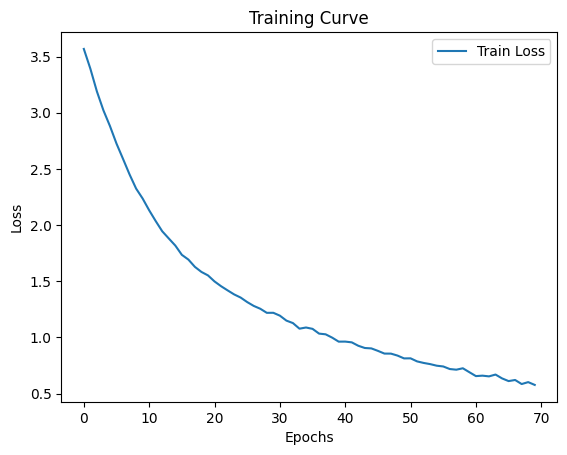

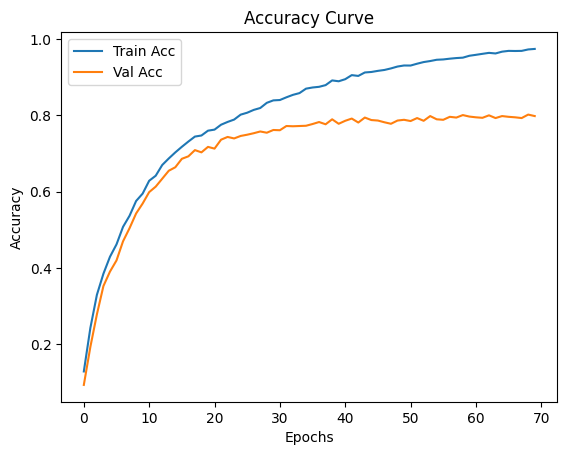

In [ ]:
data_dir = '/content/Breed-and-Service-Dog-Detection'
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

# Load precomputed features and convert them
train_features = torch.from_numpy(torch.load('train_features.pt').cpu().detach().numpy())
val_features = torch.from_numpy(torch.load('val_features.pt').cpu().detach().numpy())
test_features = torch.from_numpy(torch.load('test_features.pt').cpu().detach().numpy())

# Create TensorDatasets
train_dataset = TensorDataset(train_features, train_labels)
val_dataset = TensorDataset(val_features, val_labels)
test_dataset = TensorDataset(test_features, test_labels)

# Create DataLoaders
batch_size = 128
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=batch_size)
test_loader = DataLoader(test_dataset, batch_size=batch_size)

model = Classifier_Breed(dropout=0.5)
train_extracted_features(model, train_loader, val_loader, num_epochs=70, learning_rate=0.001, batch_size=128)

#### Model 2

- bs = 256

- lr = 0.00085

- epoch_num = 60

- dropout = 0.3

Total 60 epochs, lr = 0.00085, bs = 256.
Start training Classifier_Breed model...
CUDA available, training on GPU...
Epoch 0: Train Loss: 3.4784, Train Acc: 31.01%, Val Acc: 28.65%
Epoch 1: Train Loss: 3.1790, Train Acc: 47.88%, Val Acc: 44.60%
Epoch 2: Train Loss: 2.9201, Train Acc: 54.06%, Val Acc: 49.67%
Epoch 3: Train Loss: 2.7174, Train Acc: 57.83%, Val Acc: 54.49%
Epoch 4: Train Loss: 2.5772, Train Acc: 61.18%, Val Acc: 58.20%
Epoch 5: Train Loss: 2.4206, Train Acc: 63.77%, Val Acc: 61.26%
Epoch 6: Train Loss: 2.2941, Train Acc: 66.84%, Val Acc: 63.80%
Epoch 7: Train Loss: 2.2027, Train Acc: 68.03%, Val Acc: 64.52%
Epoch 8: Train Loss: 2.0955, Train Acc: 69.73%, Val Acc: 66.28%
Epoch 9: Train Loss: 2.0093, Train Acc: 70.89%, Val Acc: 66.47%
Epoch 10: Train Loss: 1.9135, Train Acc: 72.22%, Val Acc: 69.14%
Epoch 11: Train Loss: 1.8326, Train Acc: 73.89%, Val Acc: 69.53%
Epoch 12: Train Loss: 1.7580, Train Acc: 75.13%, Val Acc: 70.38%
Epoch 13: Train Loss: 1.6785, Train Acc: 75.42%,

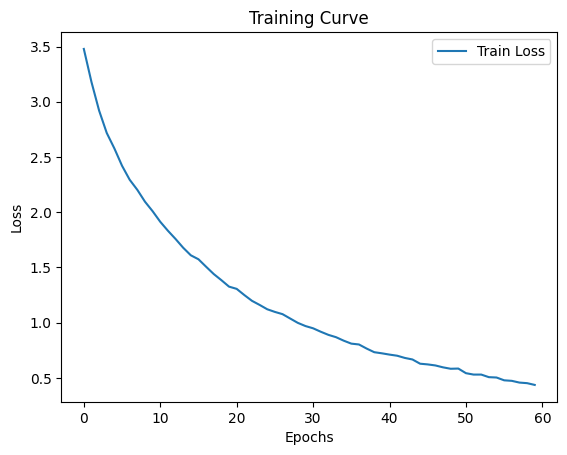

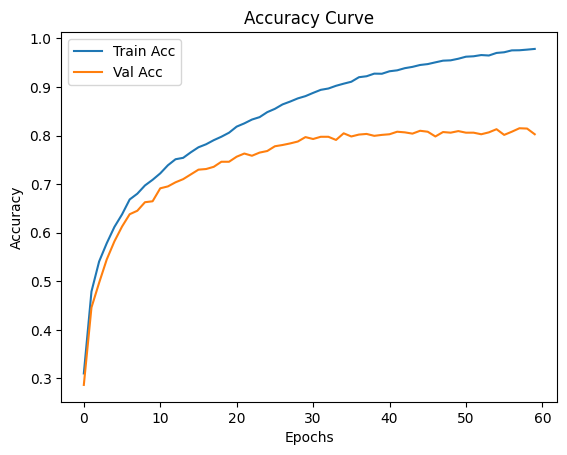

In [ ]:
data_dir = '/content/Breed-and-Service-Dog-Detection/dog_dataset'
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

# Load precomputed features and convert them
train_features = torch.from_numpy(torch.load('train_features.pt').cpu().detach().numpy())
val_features = torch.from_numpy(torch.load('val_features.pt').cpu().detach().numpy())
test_features = torch.from_numpy(torch.load('test_features.pt').cpu().detach().numpy())

# Create TensorDatasets
train_dataset = TensorDataset(train_features, train_labels)
val_dataset = TensorDataset(val_features, val_labels)
test_dataset = TensorDataset(test_features, test_labels)

# Create DataLoaders
batch_size = 256
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=batch_size)
test_loader = DataLoader(test_dataset, batch_size=batch_size)

model = Classifier_Breed(dropout=0.3)
train_extracted_features(model, train_loader, val_loader, num_epochs=60, learning_rate=0.00085, batch_size=256)

#### Model 3

- bs = 128

- lr = 0.0009

- epoch_num = 60

- dropout = 0.4

Total 60 epochs, lr = 0.0009, bs = 128.
Start training Classifier_Breed model...
CUDA available, training on GPU...
Epoch 0: Train Loss: 3.4381, Train Acc: 32.99%, Val Acc: 27.93%
Epoch 1: Train Loss: 3.1024, Train Acc: 43.79%, Val Acc: 39.84%
Epoch 2: Train Loss: 2.8230, Train Acc: 48.68%, Val Acc: 45.18%
Epoch 3: Train Loss: 2.6059, Train Acc: 51.78%, Val Acc: 48.24%
Epoch 4: Train Loss: 2.4237, Train Acc: 55.48%, Val Acc: 52.47%
Epoch 5: Train Loss: 2.2523, Train Acc: 60.30%, Val Acc: 58.53%
Epoch 6: Train Loss: 2.1244, Train Acc: 63.08%, Val Acc: 61.59%
Epoch 7: Train Loss: 1.9889, Train Acc: 66.28%, Val Acc: 65.10%
Epoch 8: Train Loss: 1.8788, Train Acc: 69.84%, Val Acc: 68.95%
Epoch 9: Train Loss: 1.7862, Train Acc: 71.30%, Val Acc: 68.95%
Epoch 10: Train Loss: 1.6895, Train Acc: 73.80%, Val Acc: 71.22%
Epoch 11: Train Loss: 1.5896, Train Acc: 75.80%, Val Acc: 73.31%
Epoch 12: Train Loss: 1.5320, Train Acc: 77.15%, Val Acc: 74.09%
Epoch 13: Train Loss: 1.4677, Train Acc: 78.69%, 

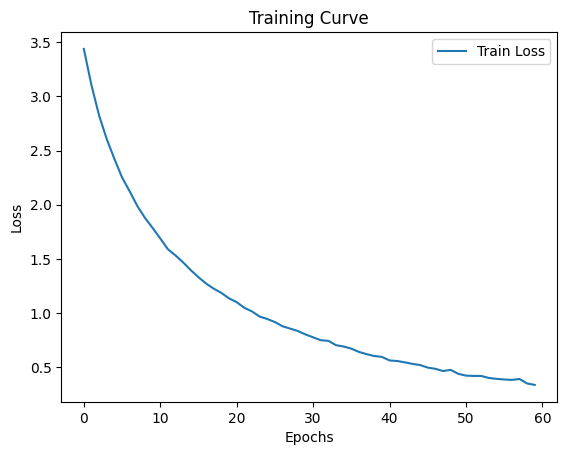

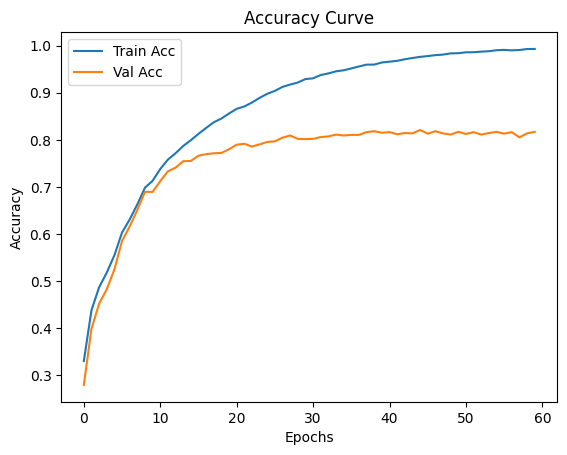

In [ ]:
data_dir = '/content/Breed-and-Service-Dog-Detection/dog_dataset'
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

# Load precomputed features and convert them
train_features = torch.from_numpy(torch.load('train_features.pt').cpu().detach().numpy())
val_features = torch.from_numpy(torch.load('val_features.pt').cpu().detach().numpy())
test_features = torch.from_numpy(torch.load('test_features.pt').cpu().detach().numpy())

# Create TensorDatasets
train_dataset = TensorDataset(train_features, train_labels)
val_dataset = TensorDataset(val_features, val_labels)
test_dataset = TensorDataset(test_features, test_labels)

# Create DataLoaders
batch_size = 128
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=batch_size)
test_loader = DataLoader(test_dataset, batch_size=batch_size)

model = Classifier_Breed(dropout=0.4)
train_extracted_features(model, train_loader, val_loader, num_epochs=60, learning_rate=0.0009, batch_size=128)

#### Model 4

- bs = 64

- lr = 0.0004

- epoch_num = 50

- dropout = 0.4

Total 50 epochs, lr = 0.0004, bs = 64.
Start training Classifier_Breed model...
CUDA available, training on GPU...
Epoch 0: Train Loss: 3.4467, Train Acc: 30.49%, Val Acc: 28.26%
Epoch 1: Train Loss: 3.1377, Train Acc: 43.75%, Val Acc: 41.80%
Epoch 2: Train Loss: 2.8905, Train Acc: 49.04%, Val Acc: 46.68%
Epoch 3: Train Loss: 2.6937, Train Acc: 52.99%, Val Acc: 50.59%
Epoch 4: Train Loss: 2.5312, Train Acc: 56.64%, Val Acc: 53.52%
Epoch 5: Train Loss: 2.3881, Train Acc: 60.80%, Val Acc: 57.68%
Epoch 6: Train Loss: 2.2453, Train Acc: 63.15%, Val Acc: 60.42%
Epoch 7: Train Loss: 2.1243, Train Acc: 65.30%, Val Acc: 62.24%
Epoch 8: Train Loss: 2.0188, Train Acc: 67.47%, Val Acc: 64.06%
Epoch 9: Train Loss: 1.9132, Train Acc: 69.42%, Val Acc: 67.06%
Epoch 10: Train Loss: 1.8313, Train Acc: 71.60%, Val Acc: 69.40%
Epoch 11: Train Loss: 1.7441, Train Acc: 73.64%, Val Acc: 71.42%
Epoch 12: Train Loss: 1.6639, Train Acc: 74.88%, Val Acc: 72.14%
Epoch 13: Train Loss: 1.5954, Train Acc: 76.59%, V

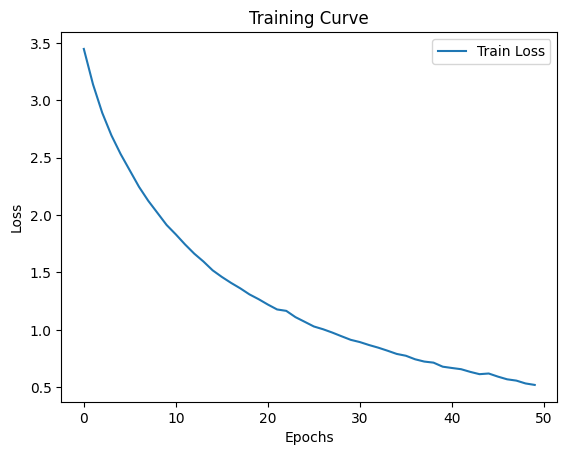

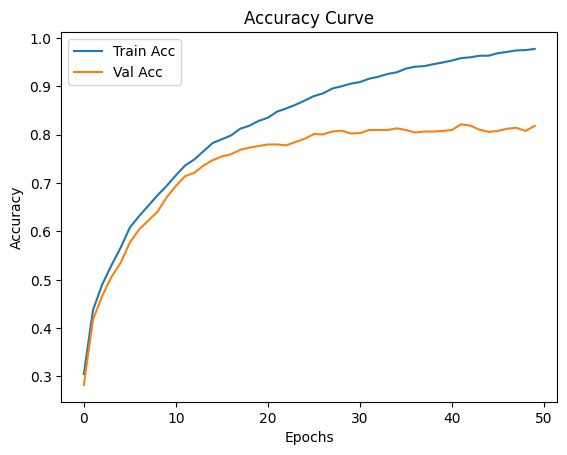

In [ ]:
data_dir = '/content/Breed-and-Service-Dog-Detection/dog_dataset'
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

# Load precomputed features and convert them
train_features = torch.from_numpy(torch.load('train_features.pt').cpu().detach().numpy())
val_features = torch.from_numpy(torch.load('val_features.pt').cpu().detach().numpy())
test_features = torch.from_numpy(torch.load('test_features.pt').cpu().detach().numpy())

# Create TensorDatasets
train_dataset = TensorDataset(train_features, train_labels)
val_dataset = TensorDataset(val_features, val_labels)
test_dataset = TensorDataset(test_features, test_labels)

# Create DataLoaders
batch_size = 64
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=batch_size)
test_loader = DataLoader(test_dataset, batch_size=batch_size)

model = Classifier_Breed(dropout=0.4)
train_extracted_features(model, train_loader, val_loader, num_epochs=50, learning_rate=0.0004, batch_size=64)

#### Model 5

- bs = 32

- lr = 0.0004

- epoch_num = 28

- dropout = 0.4

Total 28 epochs, lr = 0.0004, bs = 32.
Start training Classifier_Breed model...
CUDA available, training on GPU...
Epoch 0: Train Loss: 3.3252, Train Acc: 45.98%, Val Acc: 42.97%
Epoch 1: Train Loss: 2.8206, Train Acc: 53.33%, Val Acc: 49.87%
Epoch 2: Train Loss: 2.4775, Train Acc: 63.45%, Val Acc: 61.07%
Epoch 3: Train Loss: 2.1996, Train Acc: 68.61%, Val Acc: 66.60%
Epoch 4: Train Loss: 1.9650, Train Acc: 71.75%, Val Acc: 69.27%
Epoch 5: Train Loss: 1.7979, Train Acc: 74.05%, Val Acc: 70.70%
Epoch 6: Train Loss: 1.6502, Train Acc: 76.86%, Val Acc: 73.37%
Epoch 7: Train Loss: 1.5348, Train Acc: 78.95%, Val Acc: 74.02%
Epoch 8: Train Loss: 1.4322, Train Acc: 80.72%, Val Acc: 76.63%
Epoch 9: Train Loss: 1.3450, Train Acc: 83.07%, Val Acc: 77.54%
Epoch 10: Train Loss: 1.2675, Train Acc: 84.80%, Val Acc: 79.17%
Epoch 11: Train Loss: 1.1964, Train Acc: 86.40%, Val Acc: 80.01%
Epoch 12: Train Loss: 1.1237, Train Acc: 87.48%, Val Acc: 79.69%
Epoch 13: Train Loss: 1.0543, Train Acc: 88.67%, V

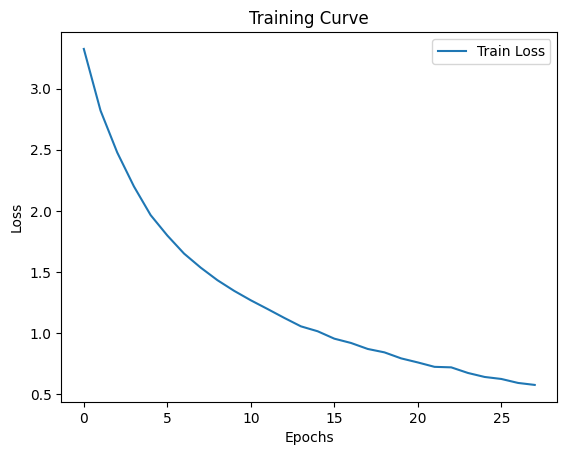

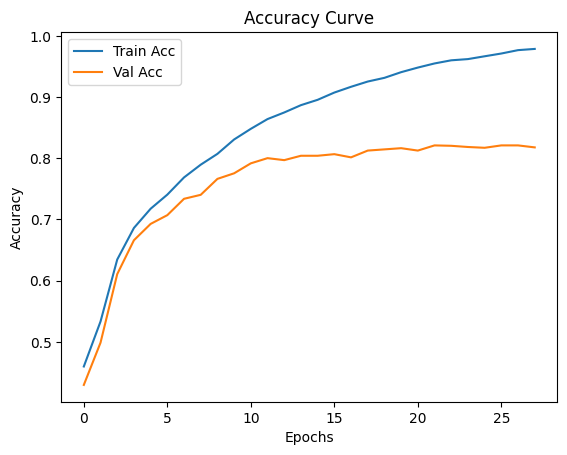

In [ ]:
data_dir = '/content/Breed-and-Service-Dog-Detection/dog_dataset'
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

# Load precomputed features and convert them
train_features = torch.from_numpy(torch.load('train_features.pt').cpu().detach().numpy())
val_features = torch.from_numpy(torch.load('val_features.pt').cpu().detach().numpy())
test_features = torch.from_numpy(torch.load('test_features.pt').cpu().detach().numpy())

# Create TensorDatasets
train_dataset = TensorDataset(train_features, train_labels)
val_dataset = TensorDataset(val_features, val_labels)
test_dataset = TensorDataset(test_features, test_labels)

# Create DataLoaders
batch_size = 32
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=batch_size)
test_loader = DataLoader(test_dataset, batch_size=batch_size)

model = Classifier_Breed(dropout=0.4)
train_extracted_features(model, train_loader, val_loader, num_epochs=28, learning_rate=0.0004, batch_size=32)

### 4.2 Quantitative Result

Here we compare the best 5 models that we obtain from hyperparameter tuning.

From the table below, the best training model from **Model 4** has the highest validation accuracy of 0.8216, with the batch size of 64, learning rate of 0.00040, dropouy of 0.4 and epoch of 41. While looking back at the training loss curve and training and validation accuracy curve, it performs smoother with less fluctuations than curves plotted from other models.

In [ ]:
# comparing 5 models
data = {
    "Model Path": [
        "model_Classifier_Breed_bs128_lr0.001_epoch68.pth",
        "model_Classifier_Breed_bs256_lr0.00085_epoch57.pth",
        "model_Classifier_Breed_bs128_lr0.0009_epoch44.pth",
        "model_Classifier_Breed_bs64_lr0.0004_epoch41.pth",
        "model_Classifier_Breed_bs32_lr0.0004_epoch21.pth"
    ],
    "Batch Size": [128, 256, 128, 64, 32],
    "Learning Rate": [0.001, 0.00085, 0.0009, 0.0004, 0.0004],
    "Epoch": [68, 57, 44, 41, 21],
    "Accuracy": [0.8021, 0.8151, 0.8210, 0.8216, 0.8210]
}

comparison_df = pd.DataFrame(data)
comparison_df = comparison_df.sort_values(by="Accuracy", ascending=False)
comparison_df

,Model Path,Batch Size,Learning Rate,Epoch,Accuracy
3,model_Classifier_Breed_bs64_lr0.0004_epoch41.pth,64,0.00040,41,0.8216
2,model_Classifier_Breed_bs128_lr0.0009_epoch44.pth,128,0.00090,44,0.8210
4,model_Classifier_Breed_bs32_lr0.0004_epoch21.pth,32,0.00040,21,0.8210
1,model_Classifier_Breed_bs256_lr0.00085_epoch57...,256,0.00085,57,0.8151
0,model_Classifier_Breed_bs128_lr0.001_epoch68.pth,128,0.00100,68,0.8021


Now we are ready to perform to best model on the test dataset to evaluate the model's generalization ability on completely unseen data, which simulates real-world scenarios as closely as possible.

In [ ]:
# Evaluate the classifier on the test data
best_model_path = '/content/Breed-and-Service-Dog-Detection/model_Classifier_Breed_bs64_lr0.0004_epoch41.pth'
classifier_model = Classifier_Breed(dropout=0.4)
classifier_model.load_state_dict(torch.load(best_model_path))
classifier_model.eval()

test_accuracy = get_accuracy(classifier_model, test_loader)
print(f"Accuracy on test data: {test_accuracy * 100:.2f}%")


Accuracy on test data: 79.88%


From the printed result, we obtain a test accuracy of about 80%, indicating that the model correctly predicts the class of the input data 80% of the time on the test dataset. This level of accuracy suggests that the model has a strong ability to generalize to new, unseen data, demonstrating its effectiveness in identifying the correct categories or classes it was trained on.

### 4.3 Key Findings

1. **Model Performance**: The test accuracy of 80%, suggests that the best model from hyperparameter tuning has good generalization to unseen data.

2. **Overfitting/Underfitting**: The 5 models we observe in hyperparameter tuning have no sign of either overfitting (high training accuracy but low validation/test accuracy) or underfitting (low training and low validation/test accuracy).

3. **Data Augmentation Effects**: The rotation and the flipping to the data enhanced model robustness and helped it generalize better to unseen data by preventing overfitting. But it also somehow decreased the overall accuracy of our model (before applying data augmentation, model achieved 86% accuracy on val dataset, now, with data augmentation, model achieved 82% accuracy on val dataset)

## **5. Breed and Service Dog detection**

After classification, we are ready to perform object localization for dogs.

### 5.1 Mapping and Prediction Functions

To start the dog detection process, focus on preparing the dataset for training and mapping class labels to their respective indices for easier identification. **`class_to_idx`** allows for straightforward translation from the numerical predictions made by the model back to understandable class labels.

In [ ]:
# convert label to classes
train_dataset = datasets.ImageFolder(root=target_dir["train"], transform=transformation)
train_loader = torch.utils.data.DataLoader(train_dataset, batch_size=32, shuffle=True)

class_to_idx = train_dataset.class_to_idx

idx_to_class = {idx: class_ for class_, idx in class_to_idx.items()}


Let's take a look at the converting results.

In [ ]:
idx_to_class

{0: 'Domestic_dogs_with_clothes',
 1: 'Service_dog',
 2: 'n02085620-Chihuahua',
 3: 'n02085782-Japanese_spaniel',
 4: 'n02085936-Maltese_dog',
 5: 'n02086079-Pekinese',
 6: 'n02086240-Shih-Tzu',
 7: 'n02086646-Blenheim_spaniel',
 8: 'n02086910-papillon',
 9: 'n02087046-toy_terrier',
 10: 'n02087394-Rhodesian_ridgeback',
 11: 'n02088094-Afghan_hound',
 12: 'n02088238-basset',
 13: 'n02088364-beagle',
 14: 'n02092339-Weimaraner',
 15: 'n02096051-Airedale',
 16: 'n02096177-cairn',
 17: 'n02096437-Dandie_Dinmont',
 18: 'n02096585-Boston_bull',
 19: 'n02097047-miniature_schnauzer',
 20: 'n02099601-golden_retriever',
 21: 'n02100735-English_setter',
 22: 'n02101388-Brittany_spaniel',
 23: 'n02101556-clumber',
 24: 'n02104029-kuvasz',
 25: 'n02105162-malinois',
 26: 'n02108915-French_bulldog',
 27: 'n02110063-malamute',
 28: 'n02111889-Samoyed',
 29: 'n02112137-chow',
 30: 'n02113624-toy_poodle',
 31: 'n02115641-dingo'}

Remember we have saved the path to the best-performing model determined through previous training and evaluation phases.

In [ ]:
best_model_path = '/content/Breed-and-Service-Dog-Detection/model_Classifier_Breed_bs64_lr0.0004_epoch41.pth'

Here we prepare the ResNet-50 model by removing its final layer, allowing it to serve as a feature extractor. A custom classifier was then loaded with pre-trained weights and set to evaluation mode.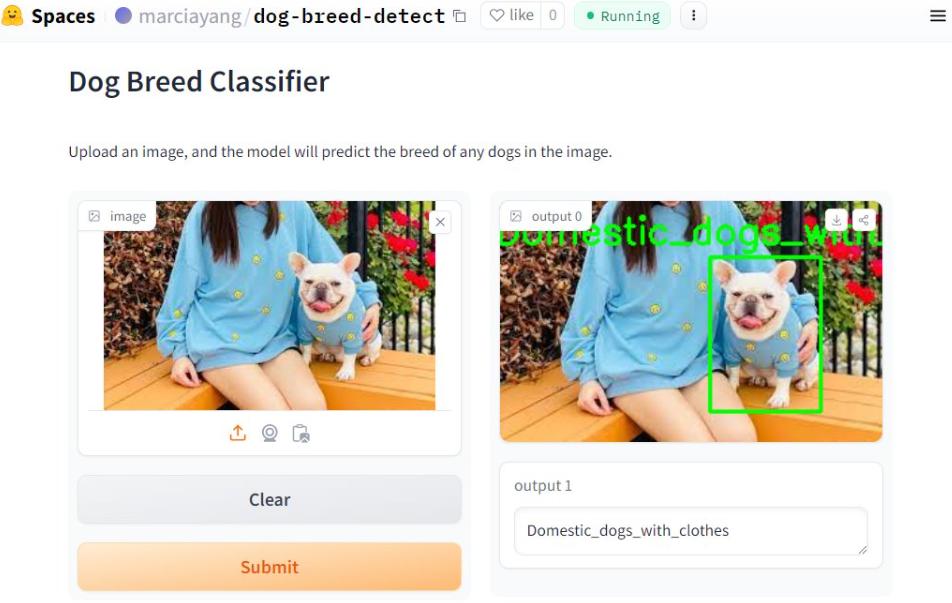

In [ ]:
# Load ResNet-50 model without the final layer
resnet50 = models.resnet50(pretrained=True)
resnet50 = torch.nn.Sequential(*(list(resnet50.children())[:-1]))
resnet50.eval()

# Load trained classifier model
classifier_model = Classifier_Breed(dropout=0.4)
classifier_model.load_state_dict(torch.load(best_model_path))
classifier_model.eval()

# Define image transformations
transformation = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
])

def predict_label(image_tensor, resnet50_model, classifier_model):
    resnet50_model.eval()
    classifier_model.eval()
    with torch.no_grad():
        if torch.cuda.is_available():
            image_tensor = image_tensor.cuda()
            resnet50_model.cuda()
            classifier_model.cuda()
        features = resnet50_model(image_tensor.unsqueeze(0))  # Add batch dimension
        features = torch.flatten(features, 1)  # Flatten the features
        outputs = classifier_model(features)
        _, predicted = torch.max(outputs, 1)
    return predicted.item()

 For image inputs, we applied specific transformations to standardize their size and format before passing them through the feature extraction and classification pipeline. This setup enabled us to predict dog breeds from images, which we demonstrated by processing a sample image, predicting its breed, and visually comparing the prediction to the true label.

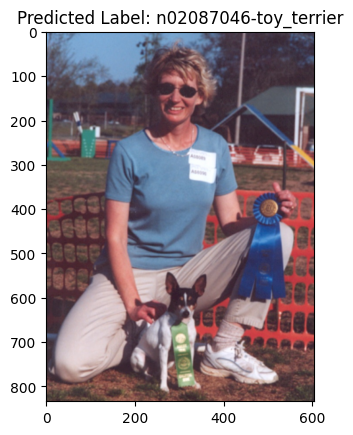

True Label: n02087046-toy_terrier
Predicted Label: n02087046-toy_terrier


In [ ]:
# predict a image using our classifier
import matplotlib.pyplot as plt
from PIL import Image
image_path = '/content/Breed-and-Service-Dog-Detection/dog_dataset/n02087046-toy_terrier/n02087046_04.jpg'
image = Image.open(image_path)
transformed_image = transformation(image)

# Predict the label
predicted_label_idx = predict_label(transformed_image, resnet50, classifier_model)
predicted_label = idx_to_class[predicted_label_idx]

# Visualize the image and print labels
plt.imshow(image)
plt.title(f'Predicted Label: {predicted_label}')
plt.show()

# Print true label
true_label = 'n02087046-toy_terrier'
print(f'True Label: {true_label}')
print(f'Predicted Label: {predicted_label}')


In the example image provided, our classifier accurately identifies the dog breed even when the dog occupies a small portion of the image. Despite its limited visibility due to partial obstruction by a flag, our classifier successfully recognizes the breed.

### 5.2 YOLOv5 Implementation

Now we are going to start our YOLOv5 implementation for real-time object detection, enabling the identification and localization of multiple objects within images or video streams.

We begin with cloning the YOLOv5 repository from GitHub to access its architecture and pretrained models. Following the repository cloning, the working directory is changed to the 'yolov5' directory, ensuring that subsequent commands operate within the context of the YOLOv5 environment.

In [ ]:
!git clone https://github.com/ultralytics/yolov5  # .git  # clone

%cd yolov5
%pip install -r requirements.txt   # install
!pip install wandb

In [ ]:
model_yolo = torch.hub.load('ultralytics/yolov5', 'yolov5s', pretrained=True)

In [ ]:
!pip install opencv-python


#### Implementation on validataion folder

Here we focus on identifying and annotating dog breeds within images from a validation dataset, leveraging YOLOv5 for object detection and a custom classifier for breed recognition.

Each dog is highlighted with a bounding box and labeled with its breed. Adjustments ensure labels are clearly visible. Annotated images are saved to an output directory, showcasing the combined capability of object detection and breed classification in enriching images with informative details.

In [ ]:
import os
from pathlib import Path
import cv2
from PIL import Image
from google.colab.patches import cv2_imshow

# Define the input and output directories
input_dir = '/content/Breed-and-Service-Dog-Detection/splitted_data/val'
output_dir = '/content/annotated_img/val'
os.makedirs(output_dir, exist_ok=True)

box_color = (0, 255, 0)
text_color = (0, 255, 0)

# Loop over each image in the input directory
for image_path in Path(input_dir).rglob('*.jpg'):
    # Read the image
    image = cv2.imread(str(image_path))
    image_predict = Image.open(image_path)
    transformed_image = transformation(image_predict)

    # Perform object detection using YOLOv5
    results = model_yolo(str(image_path))
    detections = results.pandas().xyxy[0]

    # Filter for dogs
    dogs = detections[detections['class'] == 16]

    # Process each detected dog
    for index, row in dogs.iterrows():
        # Get bounding box coordinates
        x1, y1, x2, y2 = map(int, [row['xmin'], row['ymin'], row['xmax'], row['ymax']])

        # Crop the detected dog region and convert to PIL Image
        dog_region = Image.fromarray(image[y1:y2, x1:x2].astype('uint8'), 'RGB')

        # Predict the breed of the dog
        predicted_label_idx = predict_label(transformed_image, resnet50, classifier_model)
        predicted_label = idx_to_class[predicted_label_idx]

        # Calculate width and height of the label text
        text_size = cv2.getTextSize(predicted_label, cv2.FONT_HERSHEY_SIMPLEX, 0.9, 2)[0]
        text_width = text_size[0]
        text_height = text_size[1]

        # Determine the label position based on the bounding box width
        text_x_center = x1 + (x2 - x1) / 2 - text_width / 2
        text_y = y1 - 10 if y1 - 10 > text_height else y1 + text_height + 5

        # Check if the text would go beyond the image boundaries
        if text_x_center < 0:
            text_x_center = 0
        elif text_x_center + text_width > image.shape[1]:
            text_x_center = image.shape[1] - text_width

        # Draw the bounding box on the image
        cv2.rectangle(image, (x1, y1), (x2, y2), box_color, 2)
        # Put the label on the image at the calculated position
        cv2.putText(image, predicted_label, (int(text_x_center), int(text_y)), cv2.FONT_HERSHEY_SIMPLEX, 0.9, text_color, 2)

    # Save the annotated image to the output directory
    output_image_path = os.path.join(output_dir, os.path.basename(image_path))
    cv2.imwrite(output_image_path, image)

### 5.3 Visualization

Let's see how YOLOv5 perform on validation images!

We select and display five specific images for validation folder, showing each with its filename and see if it matches the output detection.

n02096051_8553.jpg


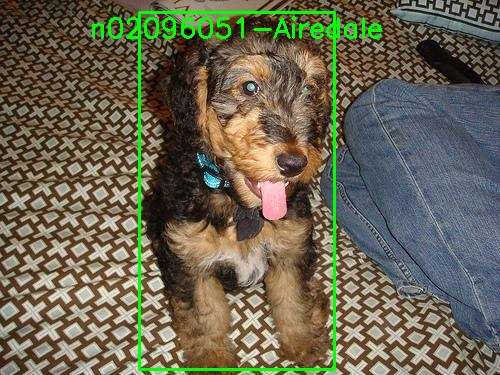

n02092339_7432_augmentation_0.jpg


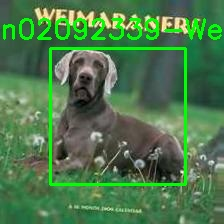

n02085620_6931.jpg


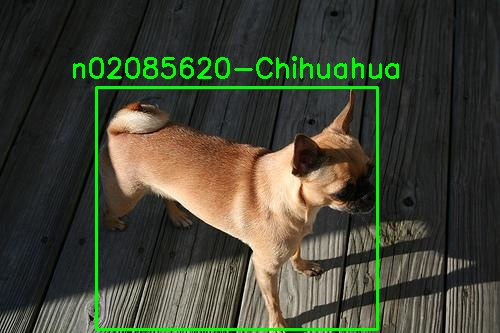

n02085936_8089.jpg


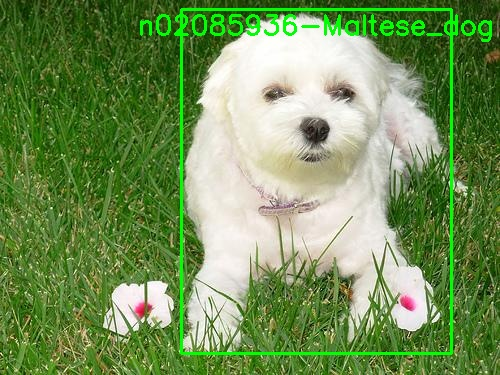

n02112137_8083_augmentation_0.jpg


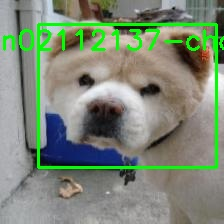

In [ ]:
# preview 5 saved annotated images (val folder)
output_dir = '/content/annotated_img/val'
output_images = os.listdir(output_dir)

# Loop through the first 5 images in the output directory
for image_name in output_images[15:20]:
    image_path = os.path.join(output_dir, image_name)
    image = cv2.imread(image_path)

    print(image_name)
    cv2_imshow(image)


From the visualized images, we can see that our model correctly detects the dogs' breed for all 5 images as the lable above the bounding box for each matches the printed filename, indicating that our model is able to efficiently  identify dog breed with high reliability.

We will be visualizing our model's performance on test image and some new images after we deploy our model under Section 8.

## **6. Evaluation and Measurement**

This part we will take you to see the test accuracy of the detection for each dog breed.

### 6.1 Accuracy Report

We create a test accuracy table containing all the breeds in the dataset to demonstrate and compare their accuracies.

In [ ]:
model = Classifier_Breed(dropout=0.4)

test_set_dir = '/content/annotated_img/test'
model_path = '/content/Breed-and-Service-Dog-Detection/model_Classifier_Breed_bs64_lr0.0004_epoch41.pth'
state = torch.load(model_path)
model.load_state_dict(state)

# Load precomputed features and convert them
test_features = torch.from_numpy(torch.load('/content/Breed-and-Service-Dog-Detection/test_features.pt').cpu().detach().numpy())

# Create TensorDatasets
test_dataset = TensorDataset(test_features, test_labels)

# Create DataLoaders
batch_size = 32
test_loader = DataLoader(test_dataset, batch_size=batch_size)

use_cuda = True
correct = [0]*32
total = [0]*32
model.cuda()

model.eval()
for imgs, labels in test_loader: # torch.utils.data.DataLoader(test_loader, batch_size=1):
  #############################################
  #To Enable GPU Usage
  if use_cuda and torch.cuda.is_available():
    imgs = imgs.cuda()
    labels = labels.cuda()
  #############################################
  output = model(imgs)

  #select index with maximum prediction score
  pred = output.max(1, keepdim=True)[1]

  # Update correct and total lists for each class
  for i in range(len(labels)):
    label = labels[i].item()
    pred_label = pred[i].item()
    correct[label] += int(pred_label == label)
    total[label] += 1

# Calculate accuracy for each class
class_accuracies = [correct[i] / total[i] * 100 if total[i] > 0 else 0 for i in range(32)]
Best_model_acc_test_Domestic_dogs_with_clothes=class_accuracies[0]
Best_model_acc_test_Service_dog=class_accuracies[1]
Best_model_acc_test_n02085620_Chihuahua=class_accuracies[2]
Best_model_acc_test_n02085782_Japanese_spaniel=class_accuracies[3]
Best_model_acc_test_n02085936_Maltese_dog=class_accuracies[4]
Best_model_acc_test_n02086079_Pekinese=class_accuracies[5]
Best_model_acc_test_n02086240_Shih_Tzu=class_accuracies[6]
Best_model_acc_test_n02086646_Blenheim_spaniel=class_accuracies[7]
Best_model_acc_test_n02086910_papillon=class_accuracies[8]
Best_model_acc_test_n02087046_toy_terrier=class_accuracies[9]
Best_model_acc_test_n02087394_Rhodesian_ridgeback=class_accuracies[10]
Best_model_acc_test_n02088094_Afghan_hound=class_accuracies[11]
Best_model_acc_test_n02088238_basset=class_accuracies[12]
Best_model_acc_test_n02088364_beagle=class_accuracies[13]
Best_model_acc_test_n02092339_Weimaraner=class_accuracies[14]
Best_model_acc_test_n02096051_Airedale=class_accuracies[15]
Best_model_acc_test_n02096177_cairn=class_accuracies[16]
Best_model_acc_test_n02096437_Dandie_Dinmont=class_accuracies[17]
Best_model_acc_test_n02096585_Boston_bull=class_accuracies[18]
Best_model_acc_test_n02097047_miniature_schnauzer=class_accuracies[19]
Best_model_acc_test_n02099601_golden_retriever=class_accuracies[20]
Best_model_acc_test_n02100735_English_setter=class_accuracies[21]
Best_model_acc_test_n02101388_Brittany_spaniel=class_accuracies[22]
Best_model_acc_test_n02101556_clumber=class_accuracies[23]
Best_model_acc_test_n02104029_kuvasz=class_accuracies[24]
Best_model_acc_test_n02105162_malinois=class_accuracies[25]
Best_model_acc_test_n02108915_French_bulldog=class_accuracies[26]
Best_model_acc_test_n02110063_malamute=class_accuracies[27]
Best_model_acc_test_n02111889_Samoyed=class_accuracies[28]
Best_model_acc_test_n02112137_chow=class_accuracies[29]
Best_model_acc_test_n02113624_toy_poodle=class_accuracies[30]
Best_model_acc_test_n02115641_dingo=class_accuracies[31]

In [ ]:
final_df = pd.DataFrame({'Breed':["Domestic_dogs_with_clothes","Service_dog","n02085620_Chihuahua","n02085782_Japanese_spaniel","n02085936_Maltese_dog",
                                  "n02086079_Pekinese","n02086240_Shih_Tzu","n02086646_Blenheim_spaniel","n02086910_papillon","n02087046_toy_terrier",
                                  "n02087394_Rhodesian_ridgeback","n02088094_Afghan_hound","n02088238_basset","n02088364_beagle","n02092339_Weimaraner",
                                  "n02096051_Airedale","n02096177_cairn","n02096437_Dandie_Dinmont","n02096585_Boston_bull","n02097047_miniature_schnauzer",
                                  "n02099601_golden_retriever","n02100735_English_setter","n02101388_Brittany_spaniel","n02101556_clumber","n02104029_kuvasz",
                                  "n02105162_malinois","n02108915_French_bulldog","n02110063_malamute","n02111889_Samoyed","n02112137_chow","n02113624_toy_poodle",
                                  "n02115641_dingo",],
                         'Test Acc %': [66.67,77.08,39.58,85.42,75,72.92,54.17,83.33,75,56.25,68.75,97.92,50,75,70.83,64.58,72.92,93.75,72.92,72.92,75,50,58.33,
                                        77.08,79.17,58.33,72.92,83.33,83.33,81.25,52.08,85.42,] })
final_df

,Breed,Test Acc %
0,Domestic_dogs_with_clothes,66.67
1,Service_dog,77.08
2,n02085620_Chihuahua,39.58
3,n02085782_Japanese_spaniel,85.42
4,n02085936_Maltese_dog,75.00
5,n02086079_Pekinese,72.92
6,n02086240_Shih_Tzu,54.17
7,n02086646_Blenheim_spaniel,83.33
8,n02086910_papillon,75.00
9,n02087046_toy_terrier,56.25


### 6.2 Evaluation and Discussion



For most of the 32 categories, the test accuracies exceeded 70%. The exception was the Chihuahua breed, which had notably lower accuracy. We attribute this underperformance to the low resolution of the Chihuahua images in the dataset, compounded by frequent occurrences where the dogs were either being held by their owners or had parts of their bodies obscured by objects. Such conditions likely limited the model's ability to extract and learn the necessary features for accurate classification of this particular breed.

## **7. Deployment**

Based on our models, we deploy a mini website for classifying dog breeds, please feel free to use the link to try with your photos on our website.

In [ ]:
# link to the deployed interface
https://huggingface.co/spaces/marciayang/dog-breed-detect

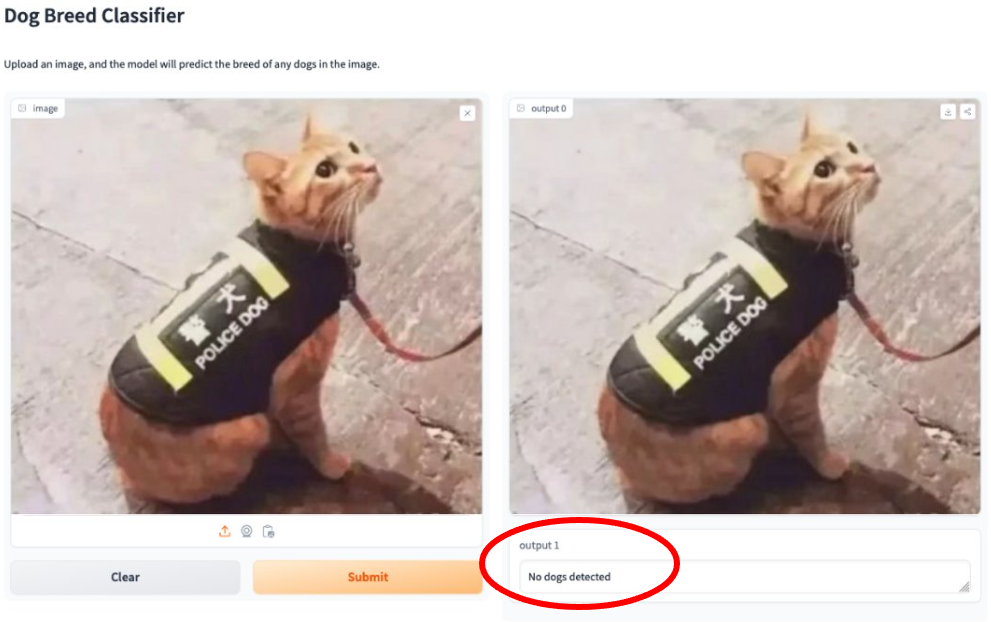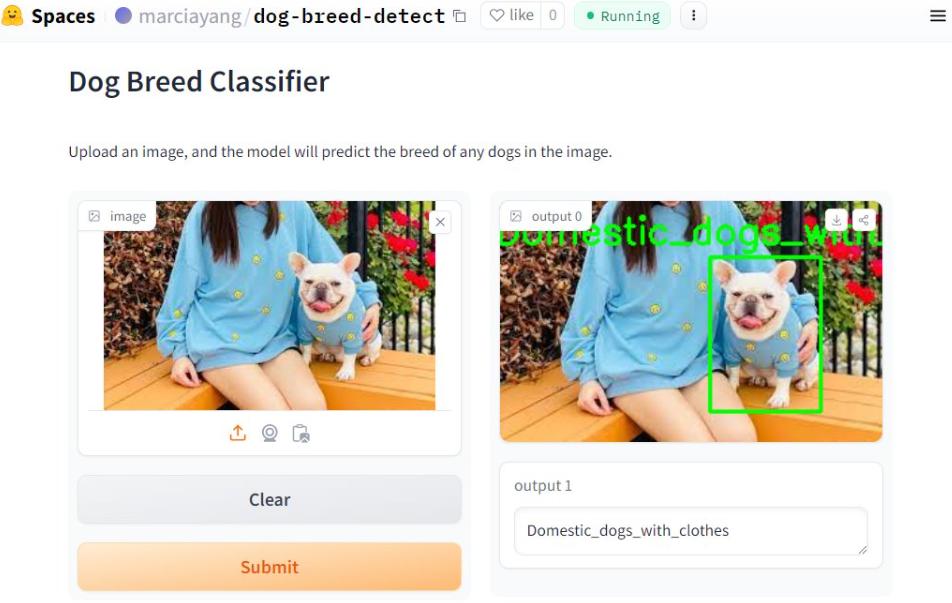

 We applied some challenging images, such as the dog in the same cloth as the owner, our model could classify its breed successfully. We also conducted a unique test by uploading an image of a cat wearing a police dog vest to evaluate our model's discernment. The result was "No Dogs Detected," illustrating our model's capability to accurately identify the species before proceeding with any classification. This confirms that our system does not rely solely on clothing (like vests) for making classifications; it prioritizes confirming the animal's species in the image, ensuring accurate and relevant outputs.








## **8. Implementation on real-life data**

Now let's implement the deployed model on Test Image and New Images data to see its preformance.

### 8.1 On Test Image and New Images

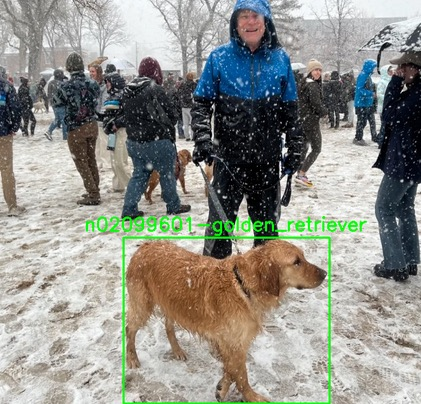
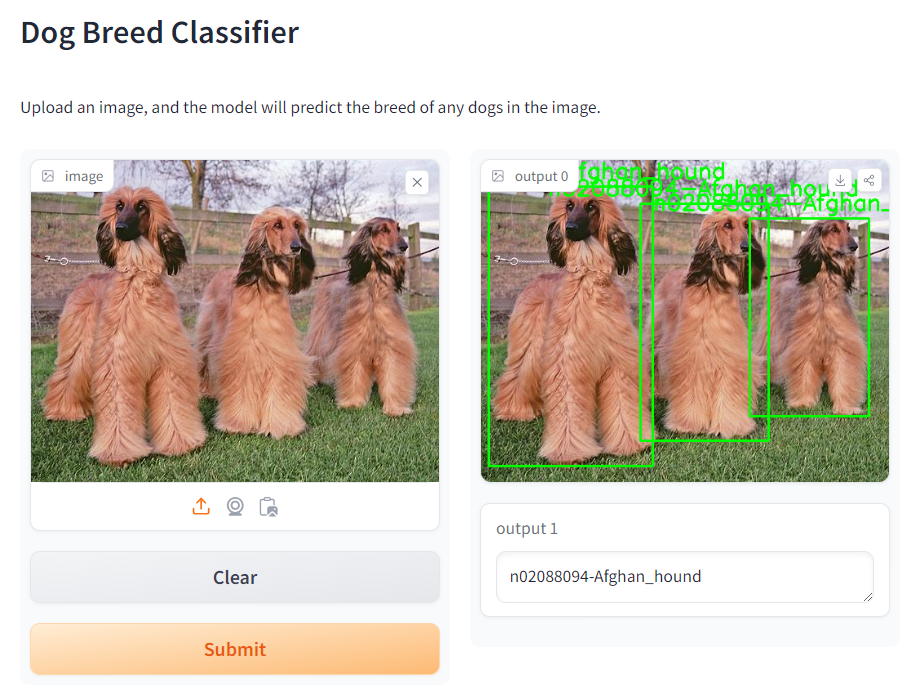

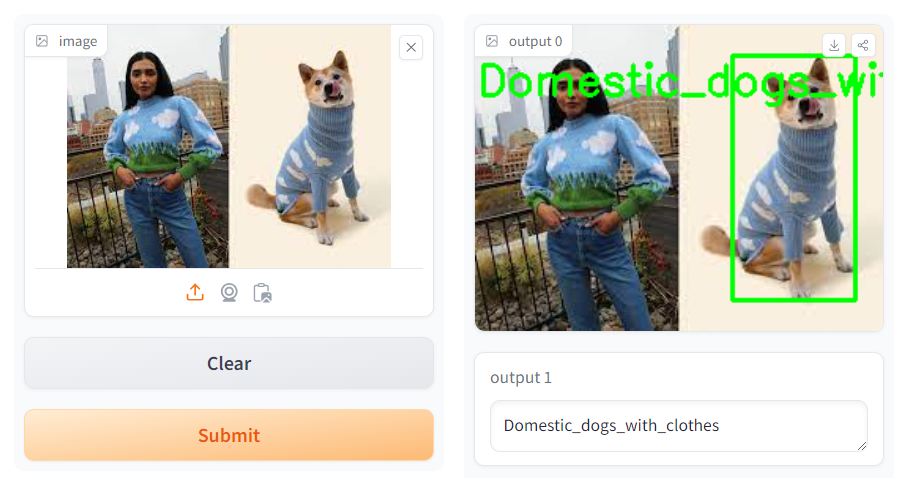
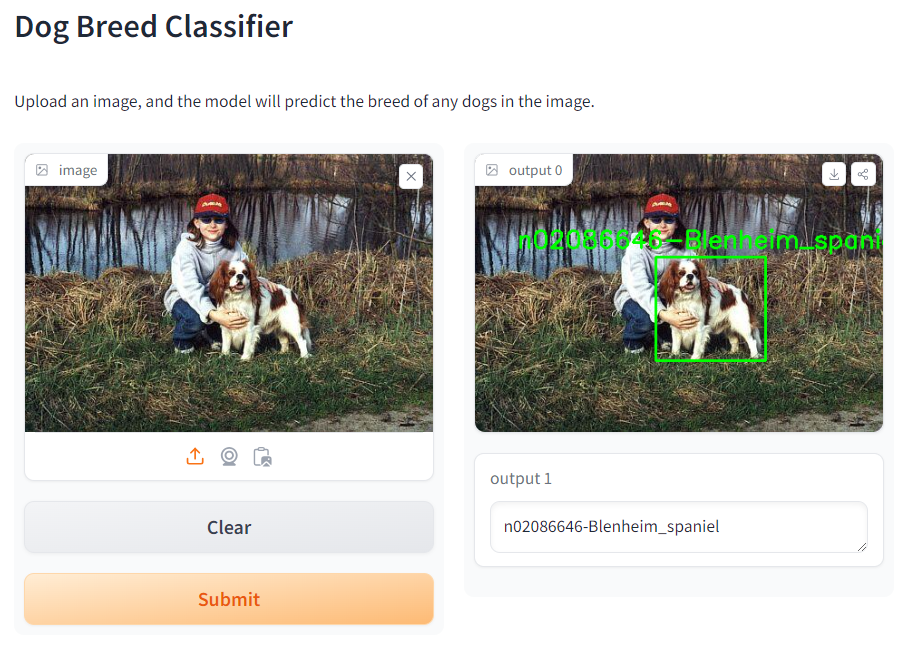

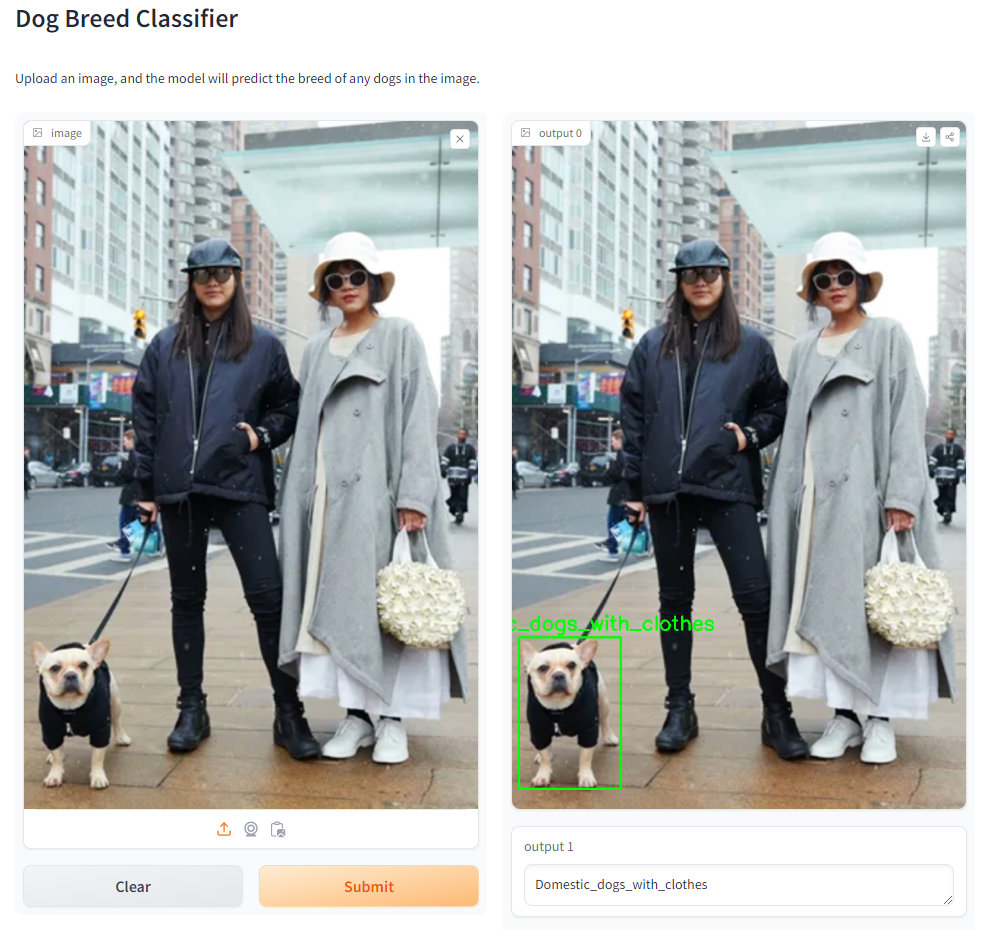
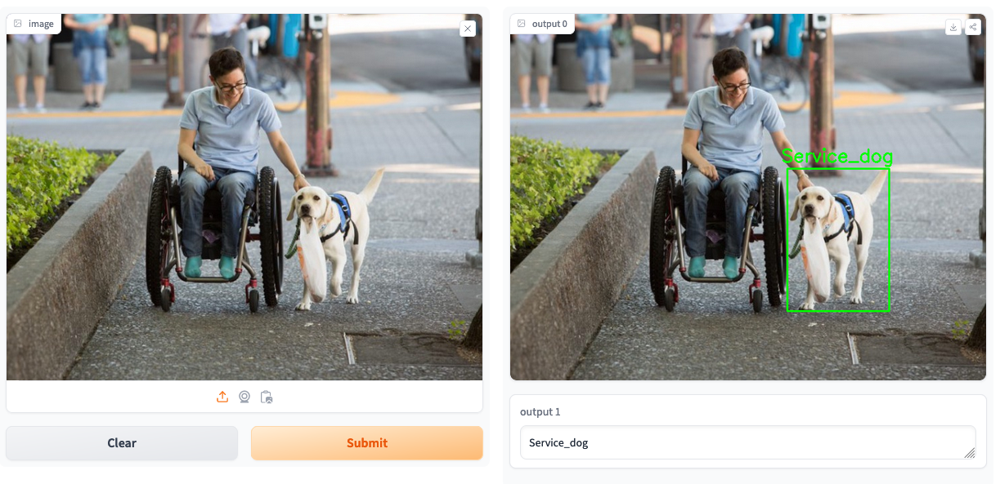

From the visualized images, it is  evident that our model distinguishes between dogs wearing vests and those not. Dogs in vests are categorized as either service dogs or domestic dogs with clothes, rather than by breed. In contrast, dogs without vests are classified into specific breeds based on their visual features. This demonstrates the model's nuanced capability to recognize attire as a distinguishing factor and classify dogs accordingly, either by their role (when clothed) or by breed characteristics (when not clothed).

Our model demonstrates exceptional precision in identifying dog breeds, even under challenging conditions where the dog is dressed in clothing similar to its owner. Furthermore, it is adept at detecting multiple dog breeds within a single image, accommodating scenarios where more than one dog is present. This capability ensures reliable breed identification regardless of visual obstacles or the number of dogs featured.














## **9. Extension: Application on Video**

We also apply a video to our model to test our model's performance.

In [ ]:
model_yolo = torch.hub.load('ultralytics/yolov5', 'yolov5s', pretrained=True)

In [ ]:
# breed classifier (input extracted feature from ResNet50)
import torch.nn as nn

class Classifier_Breed(nn.Module):
    def __init__(self, input_size=2048, num_classes=32, dropout=0.2):
        super(Classifier_Breed, self).__init__()

        # First fully connected layer
        self.fc1 = nn.Linear(input_size, 2048)  # Increased units
        self.bn1 = nn.BatchNorm1d(2048)  # Batch normalization
        self.relu1 = nn.ReLU()
        self.dropout1 = nn.Dropout(dropout)

        # Second fully connected layer
        self.fc2 = nn.Linear(2048, 1024)  # Increased units
        self.bn2 = nn.BatchNorm1d(1024)  # Batch normalization
        self.relu2 = nn.ReLU()
        self.dropout2 = nn.Dropout(dropout)

        # Third fully connected layer
        self.fc3 = nn.Linear(1024, 512)  # Increased units
        self.bn3 = nn.BatchNorm1d(512)  # Batch normalization
        self.relu3 = nn.ReLU()
        self.dropout3 = nn.Dropout(dropout)

        # Fourth fully connected layer
        self.fc4 = nn.Linear(512, 256)  # Increased units
        self.bn4 = nn.BatchNorm1d(256)  # Batch normalization
        self.relu4 = nn.ReLU()
        self.dropout4 = nn.Dropout(dropout)

        # Fifth fully connected layer
        self.fc5 = nn.Linear(256, 64)  # Increased units
        self.bn5 = nn.BatchNorm1d(64)  # Batch normalization
        self.relu5 = nn.ReLU()
        self.dropout5 = nn.Dropout(dropout)

        # Final layer
        self.fc6 = nn.Linear(64, num_classes)

    def forward(self, x):
        x = self.fc1(x)
        x = self.bn1(x)
        x = self.relu1(x)
        x = self.dropout1(x)

        x = self.fc2(x)
        x = self.bn2(x)
        x = self.relu2(x)
        x = self.dropout2(x)

        x = self.fc3(x)
        x = self.bn3(x)
        x = self.relu3(x)
        x = self.dropout3(x)

        x = self.fc4(x)
        x = self.bn4(x)
        x = self.relu4(x)
        x = self.dropout4(x)

        x = self.fc5(x)
        x = self.bn5(x)
        x = self.relu5(x)
        x = self.dropout5(x)

        x = self.fc6(x)
        return x


In [ ]:
best_model_path = "/Users/marcia/Desktop/1517_project_files/model_Classifier_Breed_bs64_lr0.0004_epoch41.pth"

In [ ]:
# Load ResNet-50 model without the final layer
resnet50 = models.resnet50(pretrained=True)
resnet50 = torch.nn.Sequential(*(list(resnet50.children())[:-1]))
resnet50.eval()

# Load trained classifier model
classifier_model = Classifier_Breed(dropout=0.4)
classifier_model.load_state_dict(torch.load(best_model_path, map_location=torch.device('cpu')))
classifier_model.eval()

# Define image transformations
transformation = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
])

def predict_label(image_tensor, resnet50_model, classifier_model):
    resnet50_model.eval()
    classifier_model.eval()
    with torch.no_grad():

        features = resnet50_model(image_tensor)  # Add batch dimension   .unsqueeze(0)
        features = torch.flatten(features, 1)  # Flatten the features
        outputs = classifier_model(features)
        _, predicted = torch.max(outputs, 1)
    return predicted.item()

transformation = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
])


In [ ]:
cap = cv2.VideoCapture("/Users/marcia/Desktop/1517_project_files/test_video.mp4")

# Define the codec and create VideoWriter object
codec = cv2.VideoWriter_fourcc(*'mp4v')
output_video = cv2.VideoWriter('output_video.mp4', codec, 30, (int(cap.get(3)), int(cap.get(4))))

from PIL import Image
while True:
    ret, img = cap.read()
    if img is None:
        break

    # Perform object detection using YOLOv5
    result_video = model_yolo(img)
    df = result_video.pandas().xyxy[0]

    df = df[df['class'] == 16]

    for ind in df.index:
        # Extract the bounding box coordinates
        x1, y1 = int(df['xmin'][ind]), int(df['ymin'][ind])
        x2, y2 = int(df['xmax'][ind]), int(df['ymax'][ind])

        # Crop the detected region
        cropped_img = img[y1:y2, x1:x2]
        cropped_img_pil = Image.fromarray(cropped_img)
        transformed_image = transformation(cropped_img_pil)

        # Convert the transformed image to a PyTorch tensor and move it to GPU if available
        image_tensor = torch.unsqueeze(transformed_image, 0).cuda() if torch.cuda.is_available() else torch.unsqueeze(transformed_image, 0)

        # Predict the label using your classifier
        predicted_label = predict_label(image_tensor, resnet50, classifier_model)
        predicted_label = idx_to_class[predicted_label]

        # Get the confidence value of the YOLO prediction
        conf = df['confidence'][ind]

        # Create the text to display (predicted label + confidence)
        text = predicted_label + ' ' + str(conf.round(decimals=2))

        # Draw the bounding box and label on the image
        cv2.rectangle(img, (x1, y1), (x2, y2), (255, 255, 0), 2)
        cv2.putText(img, predicted_label, (x1, y1-5), cv2.FONT_HERSHEY_PLAIN, 2, (255,255,0), 2)

    # Write the frame to the output video
    output_video.write(img)
    # Display the image
    cv2.imshow('IMG',img)
    # cv2.waitKey(10)
    if cv2.waitKey(10) & 0xFF == ord('q'):
        break

# Release the VideoCapture and VideoWriter objects
cap.release()
output_video.release()

# Close all OpenCV windows
cv2.destroyAllWindows()

## **9. Discussion**

### **1. How do we connect YOLO with our classifier?**

In our comprehensive system, YOLOv5 initially detects dogs in images, marking them with bounding boxes. The system then extracts these marked areas, producing cropped images that focus solely on the detected dogs. Subsequently, our breed classification model examines these cropped images to determine the dogs' breeds. The culmination of this process involves annotating the original images with the predicted breeds, placing the breed names directly above the corresponding bounding boxes, thereby providing a seamless integration of detection and classification in our model's workflow.







### **2. Balancing Data Augmentation for Model Efficiency**
In our project, we explored data augmentation to enhance our dataset's diversity. Initially, applying six transformations per image overwhelmed our system due to the dataset's size, causing a crash. Reducing to two transformations revealed that excessive alterations, like 90-degree rotations, led to model confusion and overfitting. However, a moderate 15-degree rotation offered the perfect blend of variety without overburdening the model.

This experience highlighted the importance of striking a balance between augmenting data diversity and adhering to computational constraints, alongside using realistic transformations to ensure the model's applicability in real-world scenarios.


### **3. Why did we remove the last layer of ResNet?**
In transfer learning with models like ResNet50, the typical approach involves removing the last layer of the pre-trained model. The layers preceding the last one serve as feature extractors, having learned to recognize various image features such as edges, textures, and complex patterns. The original last layer of ResNet50 is designed for classifying images into 1000 categories as per the ImageNet challenge. However, for our project focused on dog breed detection and service dog identification, this classification task differs. By discarding the original last layer, we remove the model's default classification capabilities, enabling us to add a new classifier layer tailored to the specific number of classes (32 in this case) required for our project.

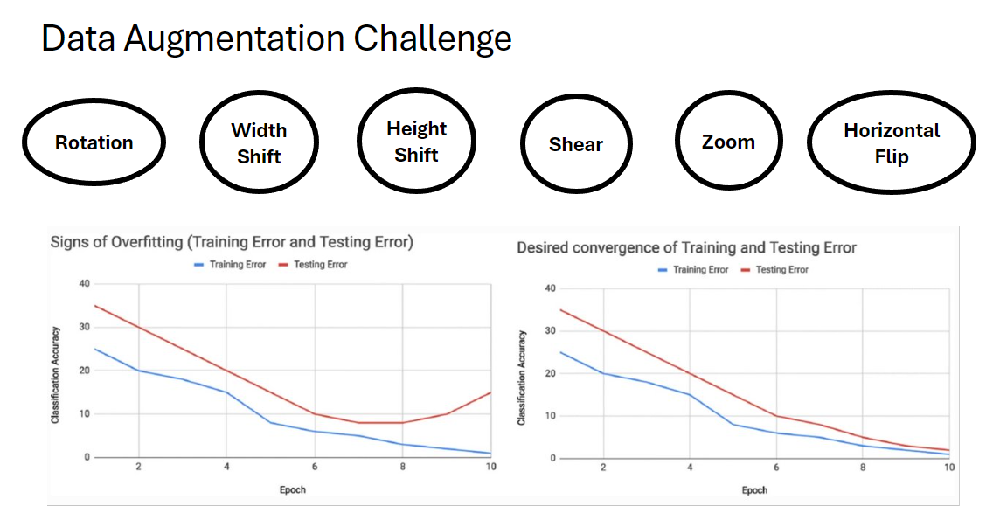

###**Reproducibility**

In our quest to ensure our project was reproducible, we encountered challenges in uploading our large dataset to GitHub. The graph here illustrates our solution: adopting Git Large File Storage (LFS), which introduced complexities, especially in tracking large files. Navigating GitHub's data management features was a novel and intricate task for us. To overcome these hurdles and keep the project accessible to our classmates and TAs, we expanded our storage and bandwidth capabilities.

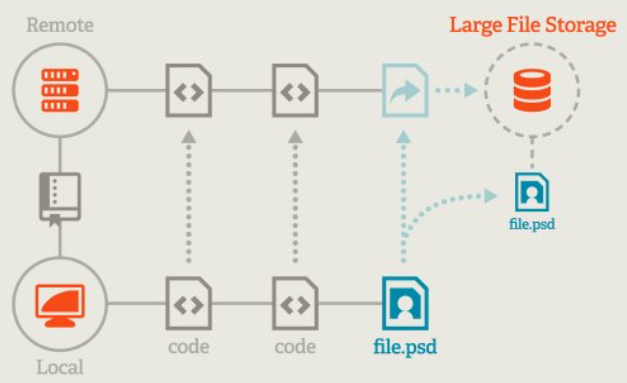

## **10. Citation**

[1]	Git Large File Storage. “Git Large File Storage.” Accessed March 31, 2024. https://git-lfs.com/.

[2]	GitHub. “Object-Detection-Using-YOLOv5/File0.Py at F4cadc334073831a34321527c98d1fdbef9c1661 · Zain18jan2000/Object-Detection-Using-YOLOv5.” Accessed April 1, 2024. https://github.com/zain18jan2000/Object-Detection-Using-YOLOv5/blob/f4cadc334073831a34321527c98d1fdbef9c1661/file0.py.

[3]	GitHub. “Yolov8-Image-Object-Detection/Yolov8_images_python.Ipynb at Main · DatumLearning/Yolov8-Image-Object-Detection.” Accessed April 1, 2024. https://github.com/DatumLearning/yolov8-image-object-detection/blob/main/yolov8_images_python.ipynb.

[4]	Herron, David. “Why Git and Git-LFS Is Not Enough to Solve the Machine Learning Reproducibility Crisis.” Medium, April 30, 2019. https://towardsdatascience.com/why-git-and-git-lfs-is-not-enough-to-solve-the-machine-learning-reproducibility-crisis-f733b49e96e8.

[5]	Jocher, Glenn. “YOLOv5 by Ultralytics.” Python, May 2020. https://doi.org/10.5281/zenodo.3908559.

[6]	Jocher, Glenn, Ayush Chaurasia, and Jing Qiu. “Ultralytics YOLO.” Python, January 2023. https://github.com/ultralytics/ultralytics.

[7]	Perform Object Detection Using YOLOv5 From Scratch In Python, 2022. https://www.youtube.com/watch?v=iQGS73aDWzE.

[8]	Shorten, Connor, and Taghi M. Khoshgoftaar. “A Survey on Image Data Augmentation for Deep Learning.” Journal of Big Data 6, no. 1 (July 6, 2019): 60. https://doi.org/10.1186/s40537-019-0197-0.

[9]	Yolov8 Image Object Detection Python | Object Detection Google Colab and YOLO | Bounding Box Yolov8, 2023. https://www.youtube.com/watch?v=_K2zIbxqSXk.